[전편] : 링크https://github.com/Vaycold/Python_ML/blob/main/Pattern_Recognition/%ED%8C%A8%ED%84%B4%ED%95%99%EC%8A%B5%20%EB%B0%8F%20%EB%B9%84%EC%A7%80%EB%8F%84%ED%95%99%EC%8A%B5.ipynb

## Library 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_moons, make_circles, make_classification

## 패턴데이터 생성

In [2]:
# 데이터 생성 - 선형관계

x_1, y_1 = make_classification(300, n_features=2, n_redundant=0, n_informative=2,random_state=1, n_clusters_per_class=1, n_classes=2,class_sep=3)
x_1[:,1] = (x_1[:,0] + x_1[:,1])/2
rng = np.random.RandomState(2)
x_1 += 2*rng.uniform(size=x_1.shape)

x_1, y_1 = make_classification(300, n_features=2, n_redundant=0, n_informative=2,random_state=1, n_clusters_per_class=1, n_classes=2,class_sep=3)
x_1[:,1] = (x_1[:,0] + x_1[:,1])/2
rng = np.random.RandomState(2)
x_1 += 2*rng.uniform(size=x_1.shape)

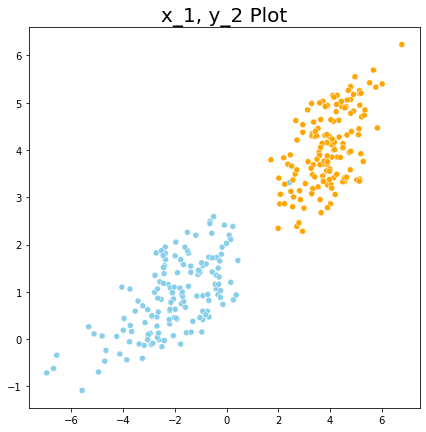

In [13]:
color_code = {0 : 'Orange', 1:'Skyblue'}
plt.figure(figsize=(7,7))

sns.scatterplot(x=x_1[:,0], y=x_1[:,1], c=[color_code.get(i) for i in y_1] )
plt.title('x_1, y_2 Plot', size=20)
plt.show()

In [65]:
# 데이터 생성 - 비선형관계
# (x,y) = ( r*cos(theta), r*sin(theta) ) 임을 활용하자
np.random.seed(1)
def circle(r, n, sigma) :
    theta = np.random.uniform(0,2*np.pi, size=n)
    x_error = np.random.normal(0, sigma, size=n)
    y_error = np.random.normal(0, sigma, size=n)

    x_val = r*np.cos(theta) + x_error
    y_val = r*np.sin(theta) + y_error

    return x_val, y_val, np.repeat(r,n)



In [66]:

n = 200
r_list = [1,3,5]
sigma = 0.2
param_list = [(r,n,sigma) for r in r_list]
param_list

[(1, 200, 0.2), (3, 200, 0.2), (5, 200, 0.2)]

In [67]:
coordinates = [ circle(param[0], param[1], param[2]) for param in param_list]

In [68]:
color_code = {1 :'Orange', 3:'Skyblue', 5:'Green'}

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



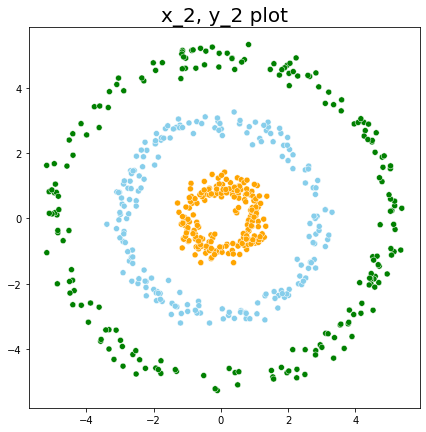

In [69]:
plt.figure(figsize=(7,7))
for j in range(0,len(coordinates)) :
  x,y,group = coordinates[j]
  sns.scatterplot(x,y,c=[color_code.get(i) for i in group])
plt.title('x_2, y_2 plot', size=20)
plt.show()


In [70]:
# 데이터가 보기 힘드니 정리를 하자.

x1,x2,y_2_bf = [np.append(np.append(coordinates[0][i], coordinates[1][i]), coordinates[2][i]) for i in range (0,3)]

In [71]:
x_2 = np.c_[x1,x2]

In [72]:
mapping_dic = {1 : 0,
               3 : 1,
               5 : 2}
y_2_bf2 = [mapping_dic.get(i) for i in y_2_bf]

y_2 = np.array(y_2_bf2)

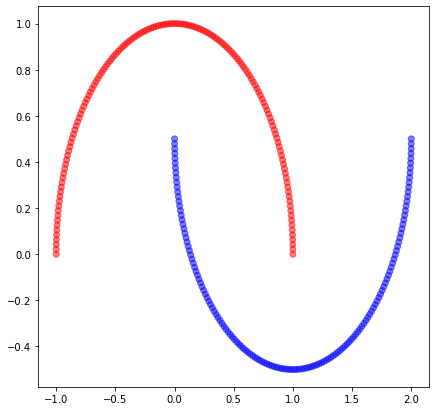

In [21]:
# 새로운 데이터 형성

x_3, y_3 = make_moons(n_samples=300, random_state=1)

plt.figure(figsize=(7,7))
color_code = { 0 : 'red', 1:'blue'}

plt.scatter(
            x_3[:,0],
            x_3[:,1],
            c = [color_code.get(i) for i in y_3], alpha=0.5
)

In [ ]:
# Spiral 데이터 생성 

!pip install git+https://github.com/lovit/synthetic_dataset

In [23]:
from soydata.data import *
x_4, y_4 = classification.make_spiral(n_samples_per_class=500, n_classes=2, n_rotations=2, gap_between_spiral=30, noise = 0.05)

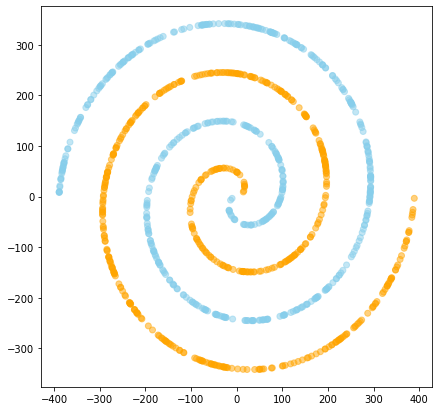

In [24]:
plt.figure(figsize=(7,7))
color_code = { 0 : 'Orange', 1:'Skyblue'}

plt.scatter(
            x_4[:,0],
            x_4[:,1],
            c = [color_code.get(i) for i in y_4], alpha=0.5
)

## Kernel PCA
    #  Kernel PCA
     - 비선형 데이터를 선형 데이터와 비슷한 형태로 바꿔줌
     - 그렇다면 비선형 데이터도 차원축소가 가능할 것이다.

    # Kernel : 얼마나 가깝냐를 뜻하는 물리량으로 생각하면 될듯

    # Ploynomial kernel : 선형이라기에는 곡선에 가까운... 그럴 때 degree 3~4정도 줘서 활용하여 boundary가 조금 완만해지는 경향이 있음
       - gamma  : scale parameter 
       - degree : kernel degree

    # Sigmoid kernel : hyperbolic tangent((-inf,inf),(-1,1)) 함수 사용  -1에서 1사이에 값을 가지는 것이 특징
       - gamma
    
    # RBF kernel : 가우시안 베이시스 커널이라고도 함. 정규분포임, 비선형일때 잘 먹음
       - gamma : 1/sigma^2 

      
                    

### RBF 커널

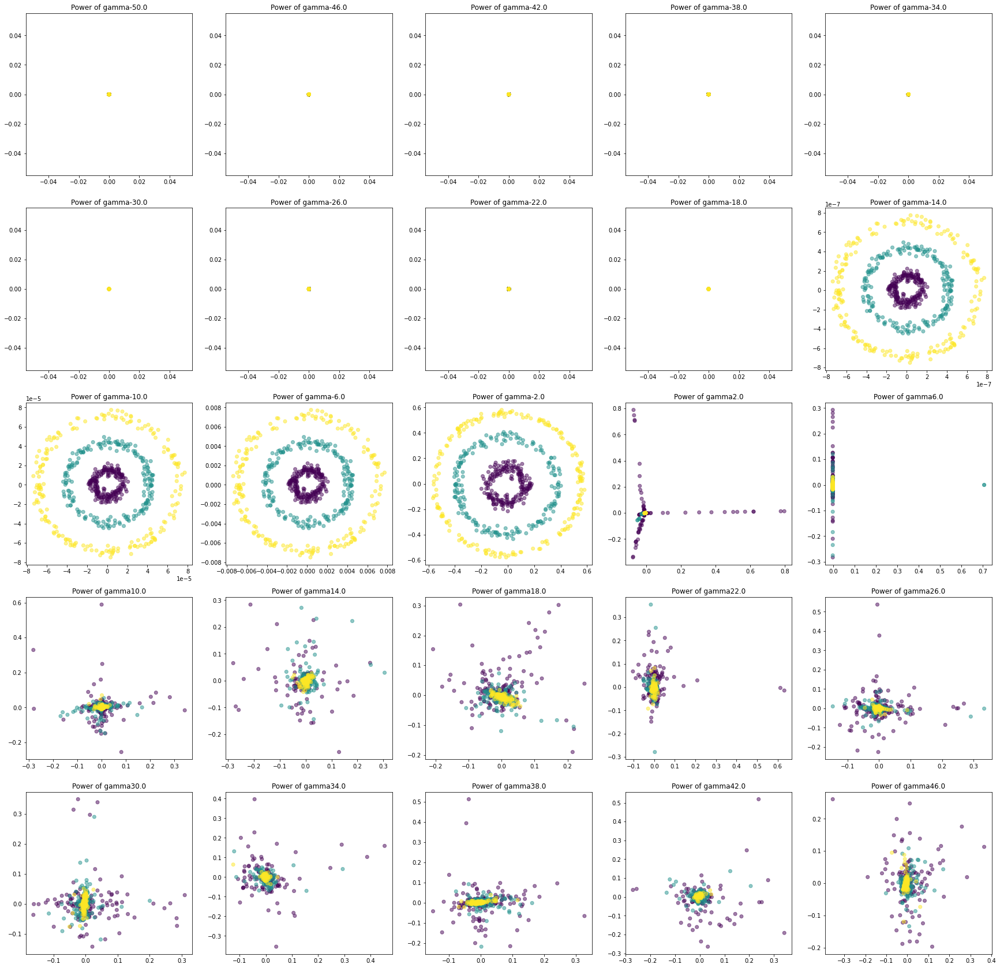

In [25]:
# kernel pca를 활용하여 비선형 패턴 구분하기

from sklearn.decomposition import KernelPCA

# 비선형 관계 데이터를 선형으로 바꿔주는 적정한 GAMMA 값을 찾아야 함.
# 이를 결정하기 위해 GRID를 25개로 설정하고 확인해보자
# 25개의 다양한 Gamma 값에 대해 kernel pca를 진행하고 plotting을 한 후 적정한 gamma에 대해 고민해보자

g_start = -50 #실제로는 50부터 안해도됨. 40부터해도됨
g_end = 50
g_power = np.arange(g_start, g_end,  (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30,30), sharex=False, sharey=False)
for n, ax in enumerate(axs.flatten()) :
  g_value = 10**g_power[n]
  scikit_kpca = KernelPCA(n_components = 2, kernel = 'rbf', gamma=g_value)
  x_kernelpca = scikit_kpca.fit_transform(x_2)
  ax.scatter(x_kernelpca[:,0], x_kernelpca[:,1], c=y_2, alpha=0.5)
  ax.set_title('Power of gamma' +str(g_power[n]), size=12)

  # gamma값이 -18에서 2사이의 값으로 다시 한번 봐보자

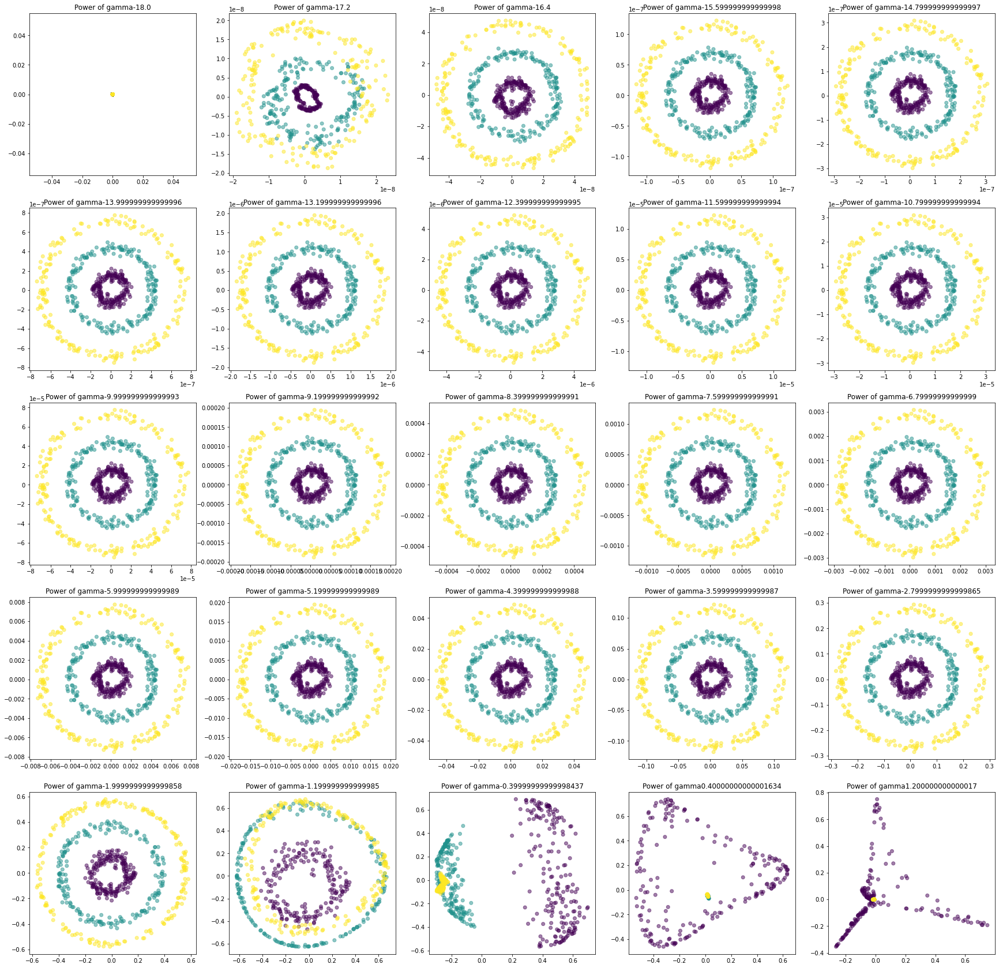

In [26]:
g_start = -18 
g_end = 2
g_power = np.arange(g_start, g_end,  (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30,30), sharex=False, sharey=False)
for n, ax in enumerate(axs.flatten()) :
  g_value = 10**g_power[n]
  scikit_kpca = KernelPCA(n_components = 2, kernel = 'rbf', gamma=g_value)
  x_kernelpca = scikit_kpca.fit_transform(x_2)
  ax.scatter(x_kernelpca[:,0], x_kernelpca[:,1], c=y_2, alpha=0.5)
  ax.set_title('Power of gamma' +str(g_power[n]), size=12)


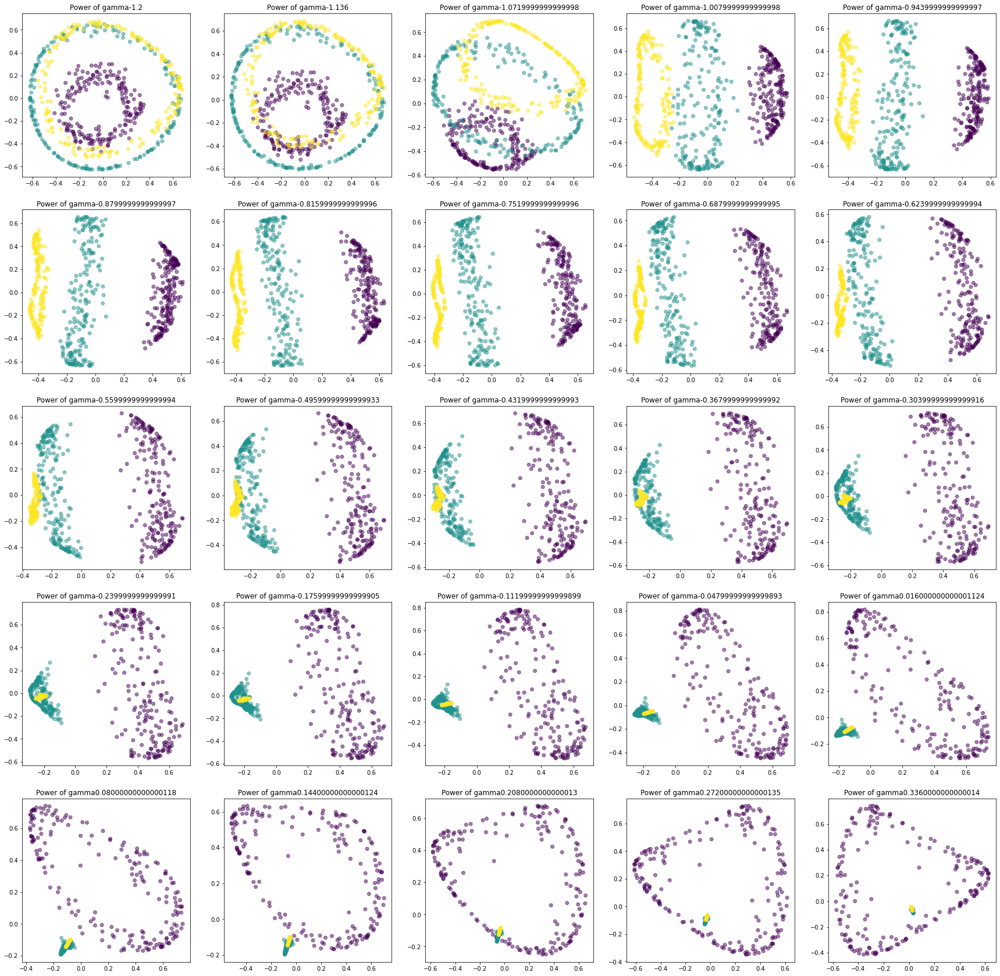

In [27]:
g_start = -1.2
g_end = 0.4
g_power = np.arange(g_start, g_end,  (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30,30), sharex=False, sharey=False)
for n, ax in enumerate(axs.flatten()) :
  g_value = 10**g_power[n]
  scikit_kpca = KernelPCA(n_components = 2, kernel = 'rbf', gamma=g_value)
  x_kernelpca = scikit_kpca.fit_transform(x_2)
  ax.scatter(x_kernelpca[:,0], x_kernelpca[:,1], c=y_2, alpha=0.5)
  ax.set_title('Power of gamma' +str(g_power[n]), size=12)
# 여기부터 보게 되면 맨 우측 맨 상단을 보게되면
# 세개가 x축으로 겹치지 않고 분리가 됨을 알 수 있다.


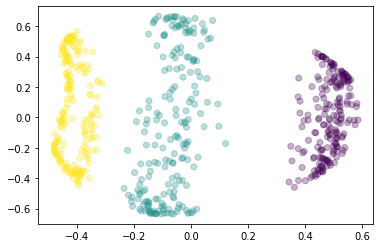

In [28]:
# 적정한 gamma를 결정하고 이를 바탕으로 plotting

g_power_value = -0.94
g_value = 10**g_power_value
scikit_kpca = KernelPCA(n_components=2, kernel = 'rbf', gamma=g_value)
x_kernpca = scikit_kpca.fit_transform(x_2)

plt.scatter(x_kernpca[:,0], x_kernpca[:,1], c=y_2,alpha=0.3)
plt.show()

### Polynimial 커널

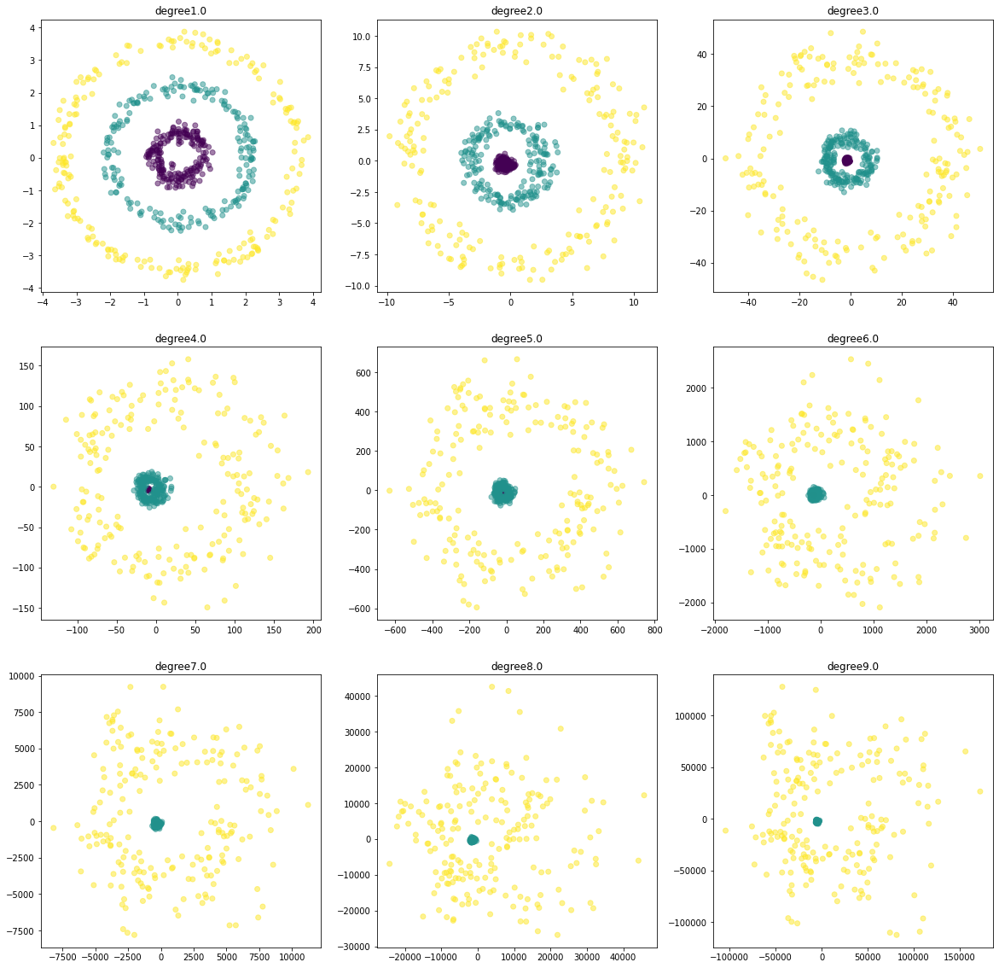

In [29]:
# 비선형 관계를 선형으로 바꿔주는 적절한 degree를 찾아야 함.
g_start = 1
g_end = 10 
g_power = np.arange(g_start, g_end,  (g_end-g_start)/9)

fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(20,20), sharex=False, sharey=False)

for n, ax in enumerate(axs.flatten()) :
  g_value = 10**g_power[n]
  scikit_kpca = KernelPCA(n_components = 2, kernel = 'poly', degree=g_power[n])
  x_kernelpca = scikit_kpca.fit_transform(x_2)
  ax.scatter(x_kernelpca[:,0], x_kernelpca[:,1], c=y_2, alpha=0.5)
  ax.set_title('degree' +str(g_power[n]), size=12)

  # 커질수록 distribution을 잃어버리는 모습 

In [ ]:
# 비선형이기 때문에 아무리 용을 써봐야 되지 않는다..

### sigmoid 커널

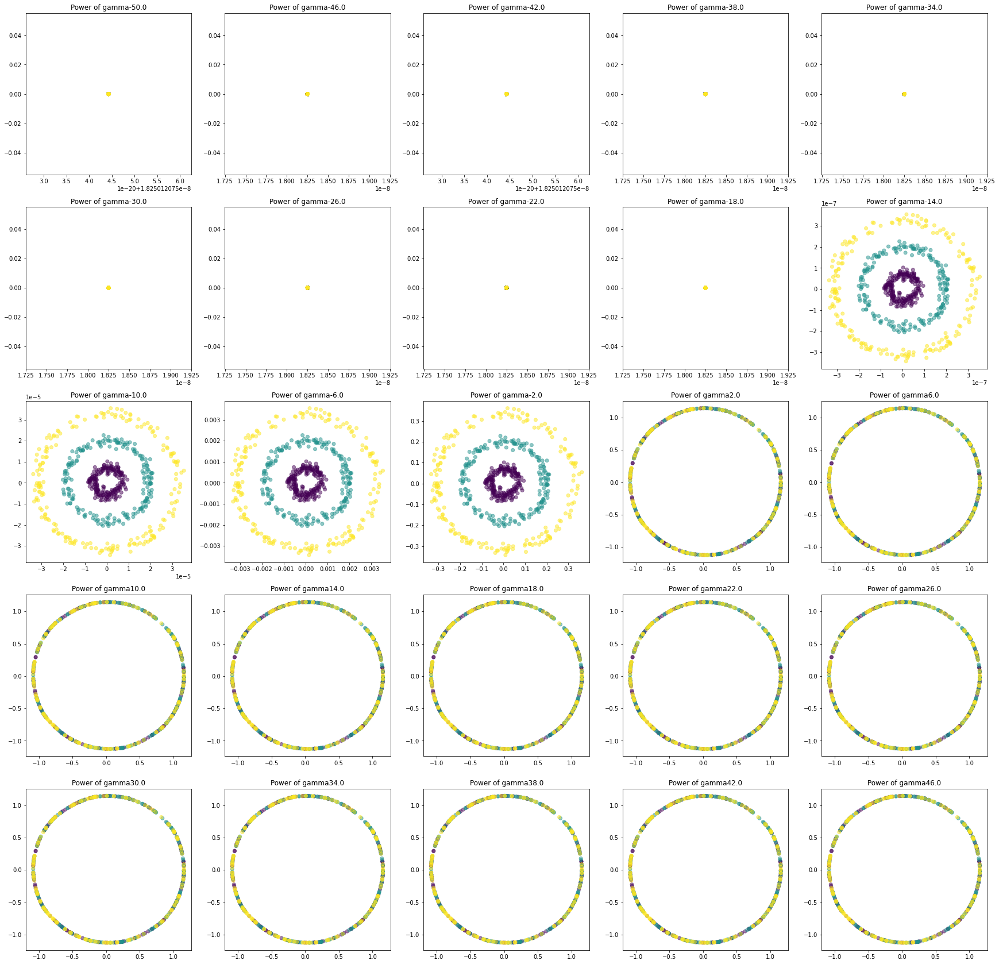

In [73]:
g_start = -50 
g_end = 50
g_power = np.arange(g_start, g_end,  (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30,30), sharex=False, sharey=False)
for n, ax in enumerate(axs.flatten()) :
  g_value = 10**g_power[n]
  scikit_kpca = KernelPCA(n_components = 2, kernel = 'sigmoid' , gamma=g_value)
  x_kernelpca = scikit_kpca.fit_transform(x_2)
  ax.scatter(x_kernelpca[:,0], x_kernelpca[:,1], c=y_2, alpha=0.5)
  ax.set_title('Power of gamma' +str(g_power[n]), size=12)
  
plt.show()

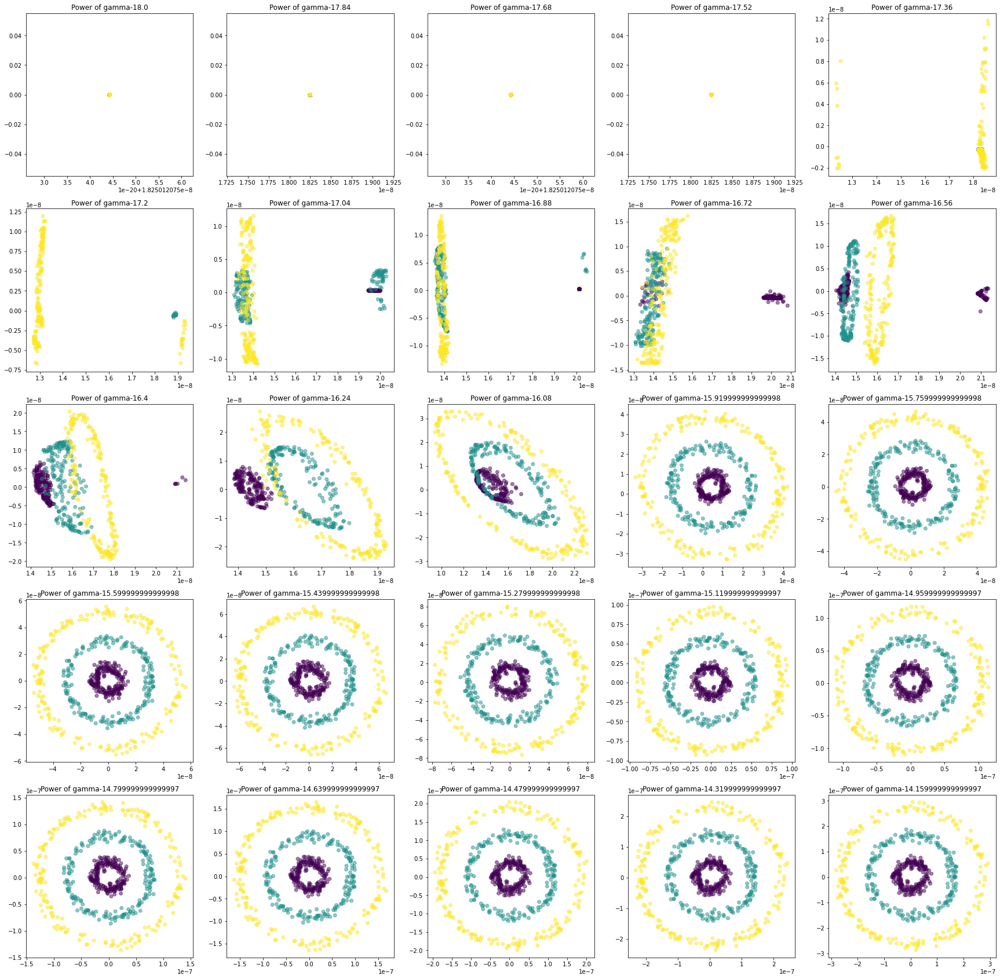

In [74]:
g_start = -18 
g_end = -14
g_power = np.arange(g_start, g_end,  (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30,30), sharex=False, sharey=False)
for n, ax in enumerate(axs.flatten()) :
  g_value = 10**g_power[n]
  scikit_kpca = KernelPCA(n_components = 2, kernel = 'sigmoid' , gamma=g_value)
  x_kernelpca = scikit_kpca.fit_transform(x_2)
  ax.scatter(x_kernelpca[:,0], x_kernelpca[:,1], c=y_2, alpha=0.5)
  ax.set_title('Power of gamma' +str(g_power[n]), size=12)

plt.show()  

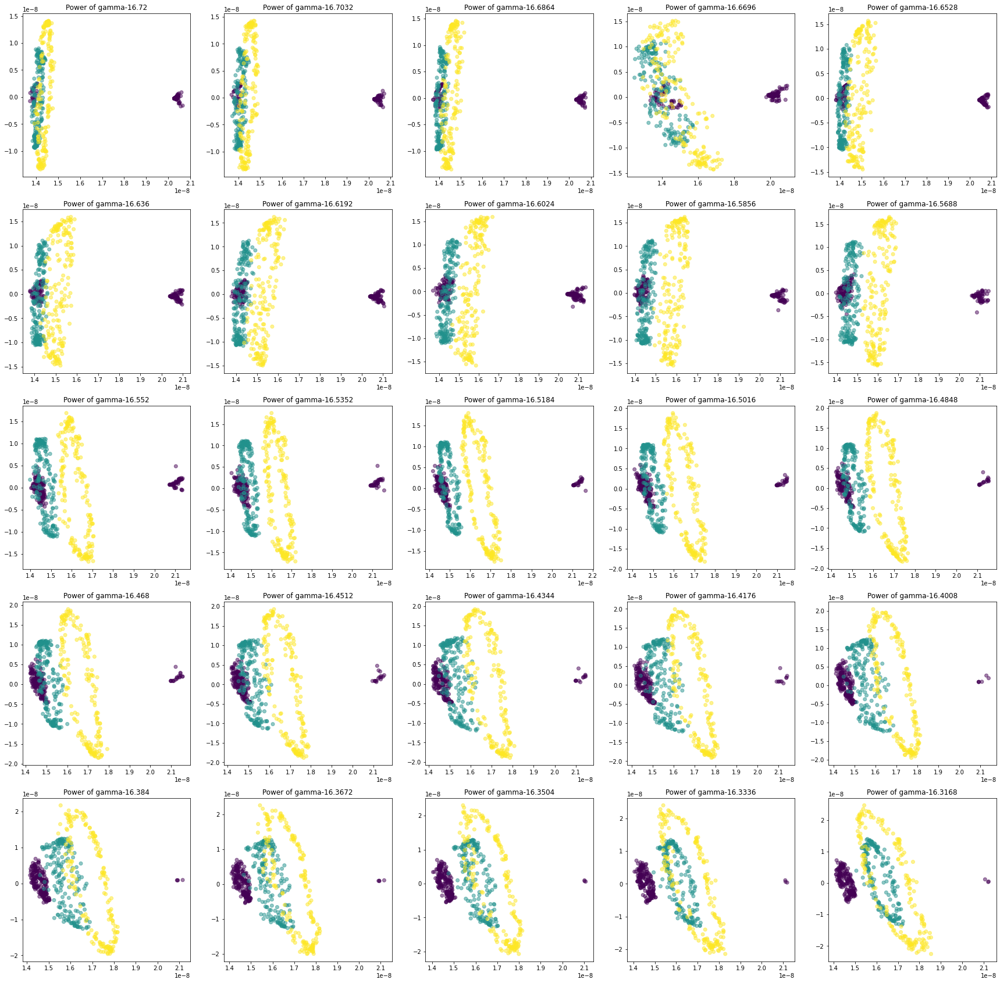

In [39]:
g_start = -16.72
g_end = -16.3
g_power = np.arange(g_start, g_end,  (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30,30), sharex=False, sharey=False)
for n, ax in enumerate(axs.flatten()) :
  g_value = 10**g_power[n]
  scikit_kpca = KernelPCA(n_components = 2, kernel = 'sigmoid' , gamma=g_value)
  x_kernelpca = scikit_kpca.fit_transform(x_2)
  ax.scatter(x_kernelpca[:,0], x_kernelpca[:,1], c=y_2, alpha=0.5)
  ax.set_title('Power of gamma' +str(g_power[n]), size=12)

plt.show()

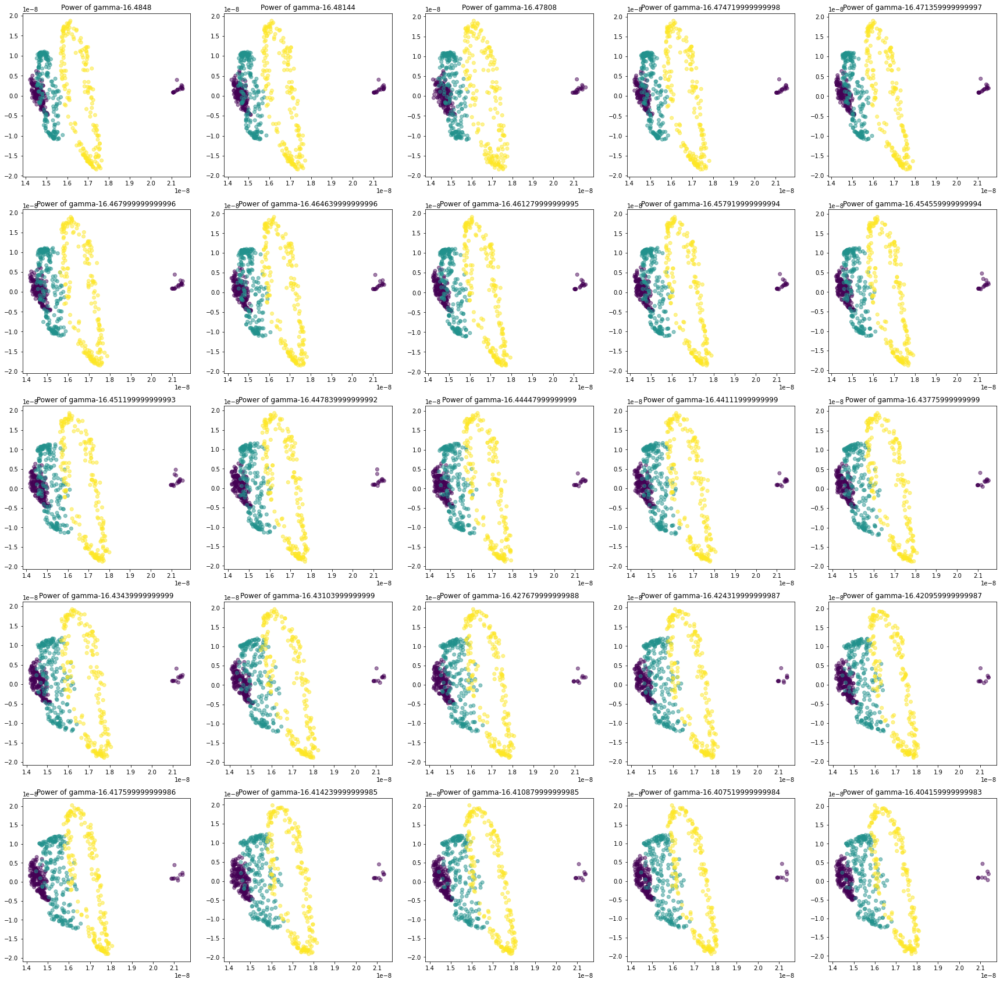

In [40]:
g_start = -16.4848
g_end = -16.4008
g_power = np.arange(g_start, g_end,  (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30,30), sharex=False, sharey=False)
for n, ax in enumerate(axs.flatten()) :
  g_value = 10**g_power[n]
  scikit_kpca = KernelPCA(n_components = 2, kernel = 'sigmoid' , gamma=g_value)
  x_kernelpca = scikit_kpca.fit_transform(x_2)
  ax.scatter(x_kernelpca[:,0], x_kernelpca[:,1], c=y_2, alpha=0.5)
  ax.set_title('Power of gamma' +str(g_power[n]), size=12)

plt.show()

## 다시

### RBF Kernel

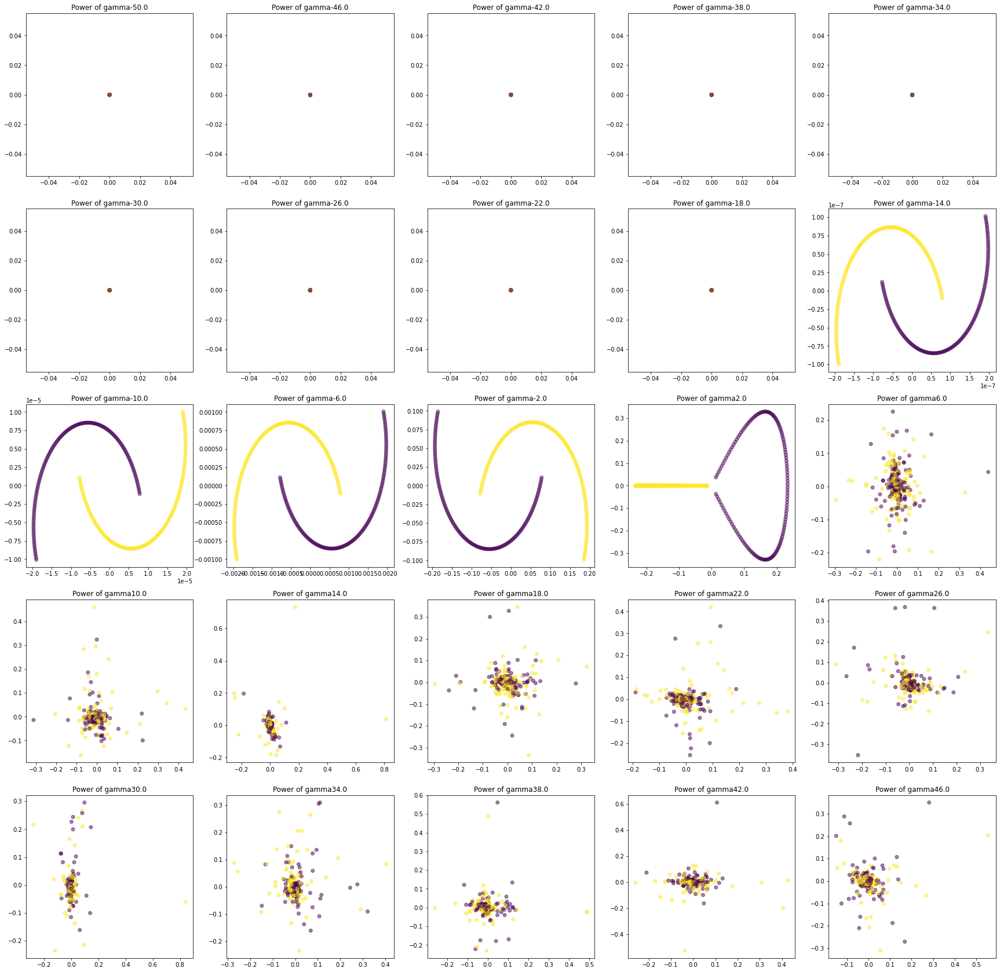

In [78]:

g_start = -50 #실제로는 50부터 안해도됨. 40부터해도됨
g_end = 50
g_power = np.arange(g_start, g_end,  (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30,30), sharex=False, sharey=False)
for n, ax in enumerate(axs.flatten()) :
  g_value = 10**g_power[n]
  scikit_kpca = KernelPCA(n_components = 2, kernel = 'rbf', gamma=g_value)
  x_kernelpca = scikit_kpca.fit_transform(x_3)
  ax.scatter(x_kernelpca[:,0], x_kernelpca[:,1], c=y_3, alpha=0.5)
  ax.set_title('Power of gamma' +str(g_power[n]), size=12)



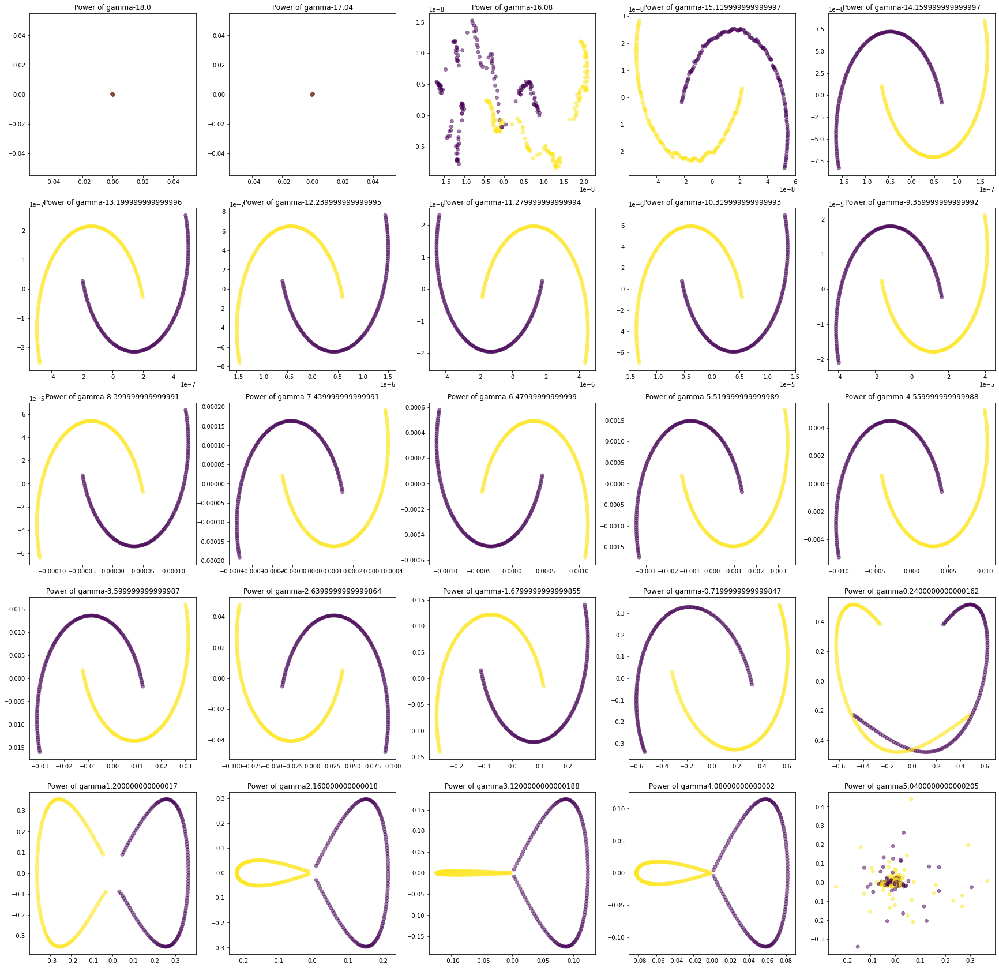

In [79]:
 
g_start = -18
g_end = 6
g_power = np.arange(g_start, g_end,  (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30,30), sharex=False, sharey=False)
for n, ax in enumerate(axs.flatten()) :
  g_value = 10**g_power[n]
  scikit_kpca = KernelPCA(n_components = 2, kernel = 'rbf', gamma=g_value)
  x_kernelpca = scikit_kpca.fit_transform(x_3)
  ax.scatter(x_kernelpca[:,0], x_kernelpca[:,1], c=y_3, alpha=0.5)
  ax.set_title('Power of gamma' +str(g_power[n]), size=12)

# 1.2일때 x축으로 구분이 가능함.

### Polynomial

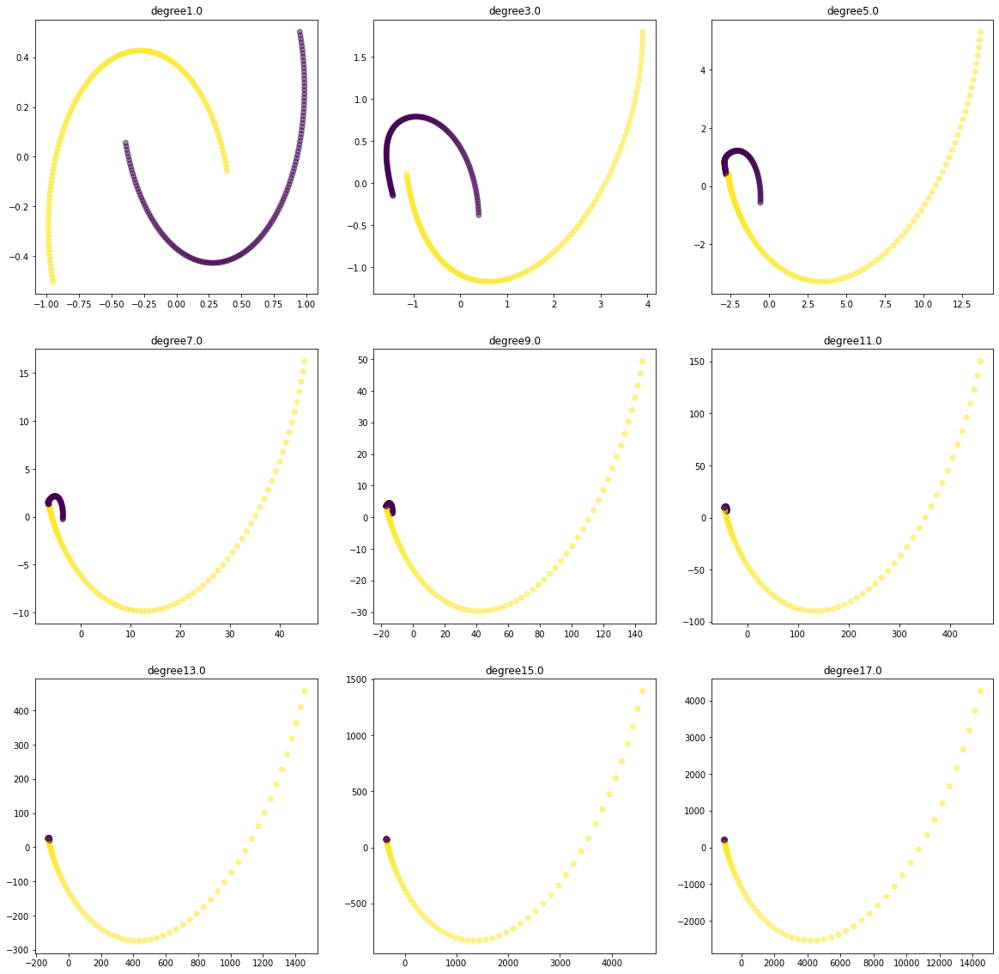

In [82]:
# 비선형 관계를 선형으로 바꿔주는 적절한 degree를 찾아야 함.
g_start=1
g_end=19
g_power = np.arange(g_start,g_end, (g_end-g_start)/9)

fig, axs = plt.subplots(nrows=3,ncols=3,figsize=(20,20),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='poly',degree=g_power[n])
  X_skernpca = scikit_kpca.fit_transform(x_3)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_3,alpha=0.5)
  ax.set_title('degree'+str(g_power[n]),size=12)

### Sigmoid

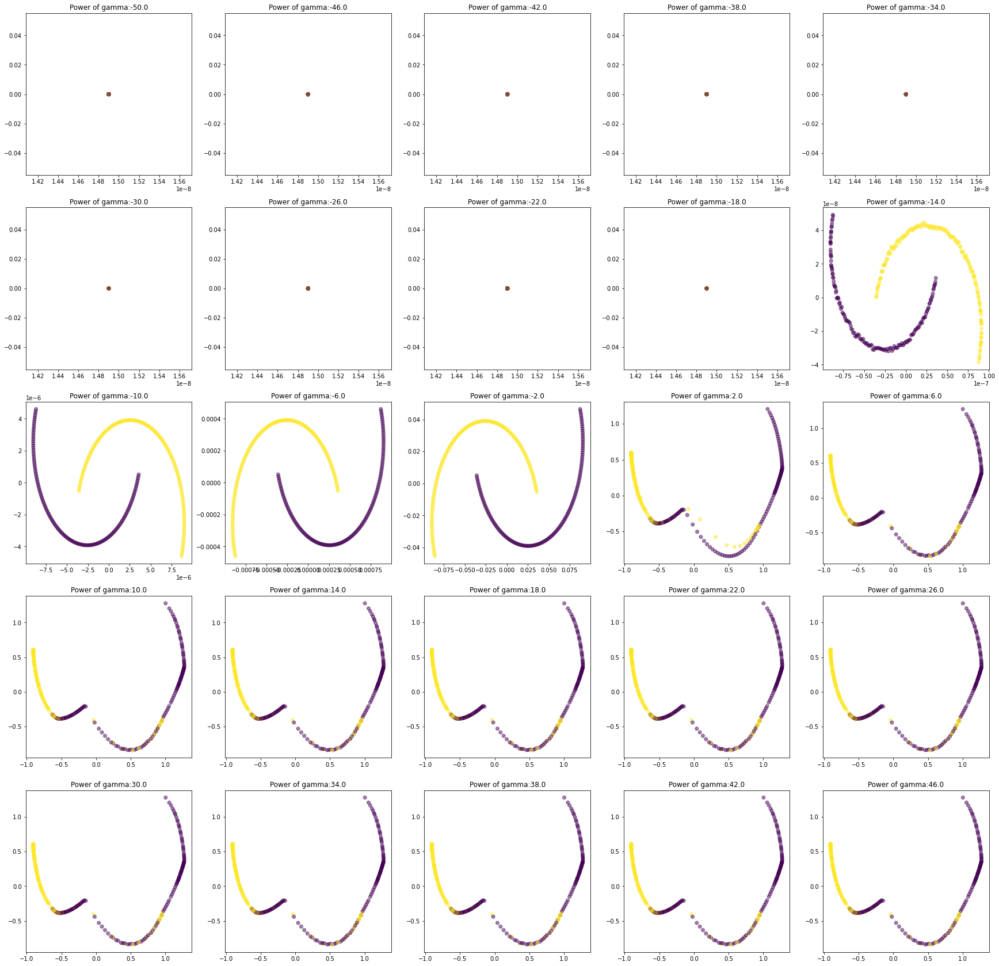

In [83]:
g_start=-50
g_end=50
g_power=np.arange(g_start,g_end,(g_end-g_start)/25)

fig,axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n , ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='sigmoid',gamma=g_value)
  X_skernpca=scikit_kpca.fit_transform(x_3)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_3,alpha=0.5)
  ax.set_title("Power of gamma:" + str(g_power[n]))

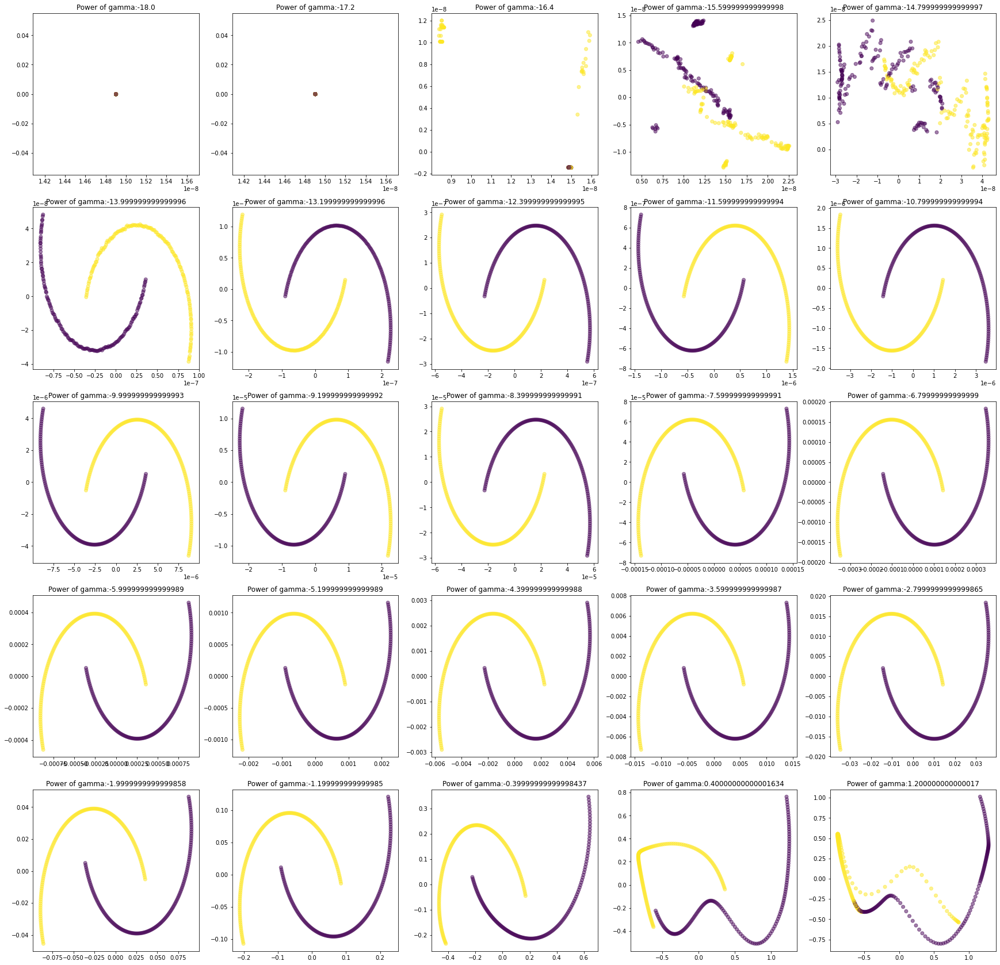

In [85]:

g_start=-18
g_end=2
g_power=np.arange(g_start,g_end,(g_end-g_start)/25)

fig,axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n , ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='sigmoid',gamma=g_value)
  X_skernpca=scikit_kpca.fit_transform(x_3)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_3,alpha=0.5)
  ax.set_title("Power of gamma:" + str(g_power[n]))



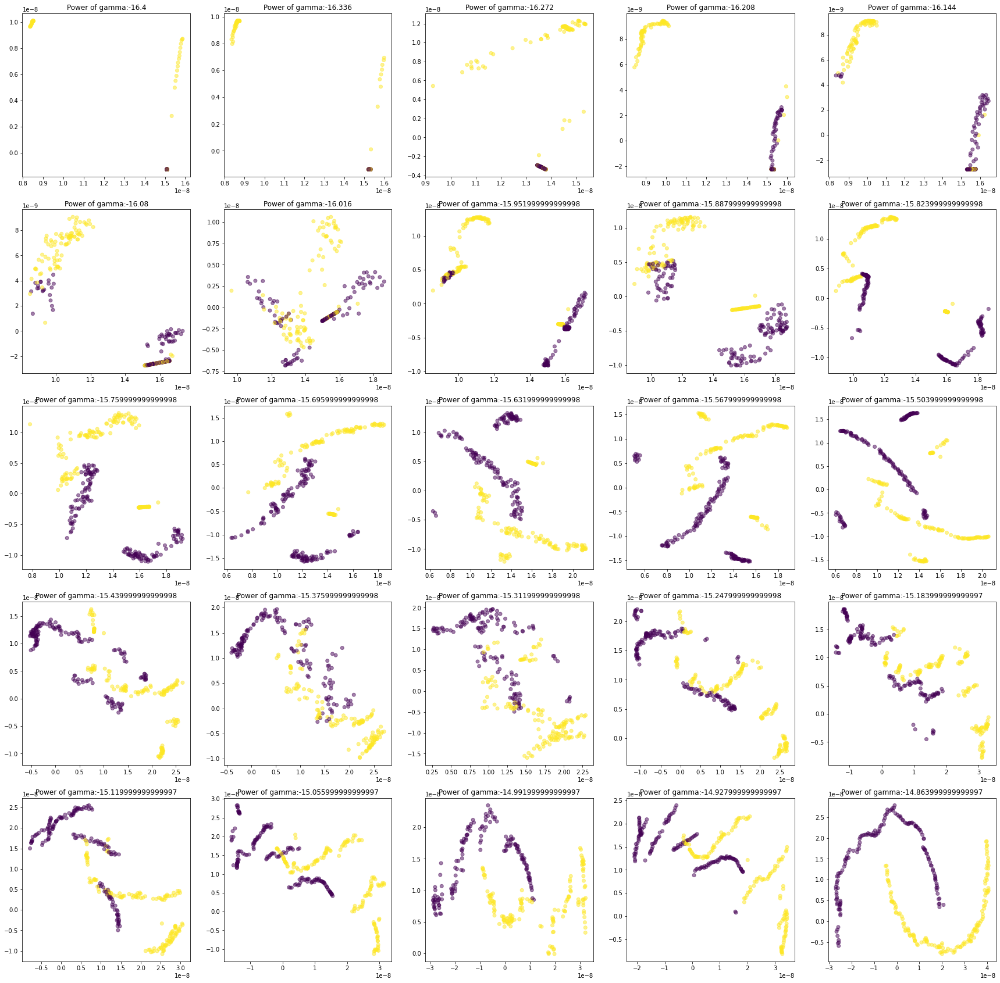

In [87]:

g_start=-16.4
g_end=-14.8
g_power=np.arange(g_start,g_end,(g_end-g_start)/25)

fig,axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n , ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='sigmoid',gamma=g_value)
  X_skernpca=scikit_kpca.fit_transform(x_3)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_3,alpha=0.5)
  ax.set_title("Power of gamma:" + str(g_power[n]))



## 마지막 spiral pattern


### RBF Kernel

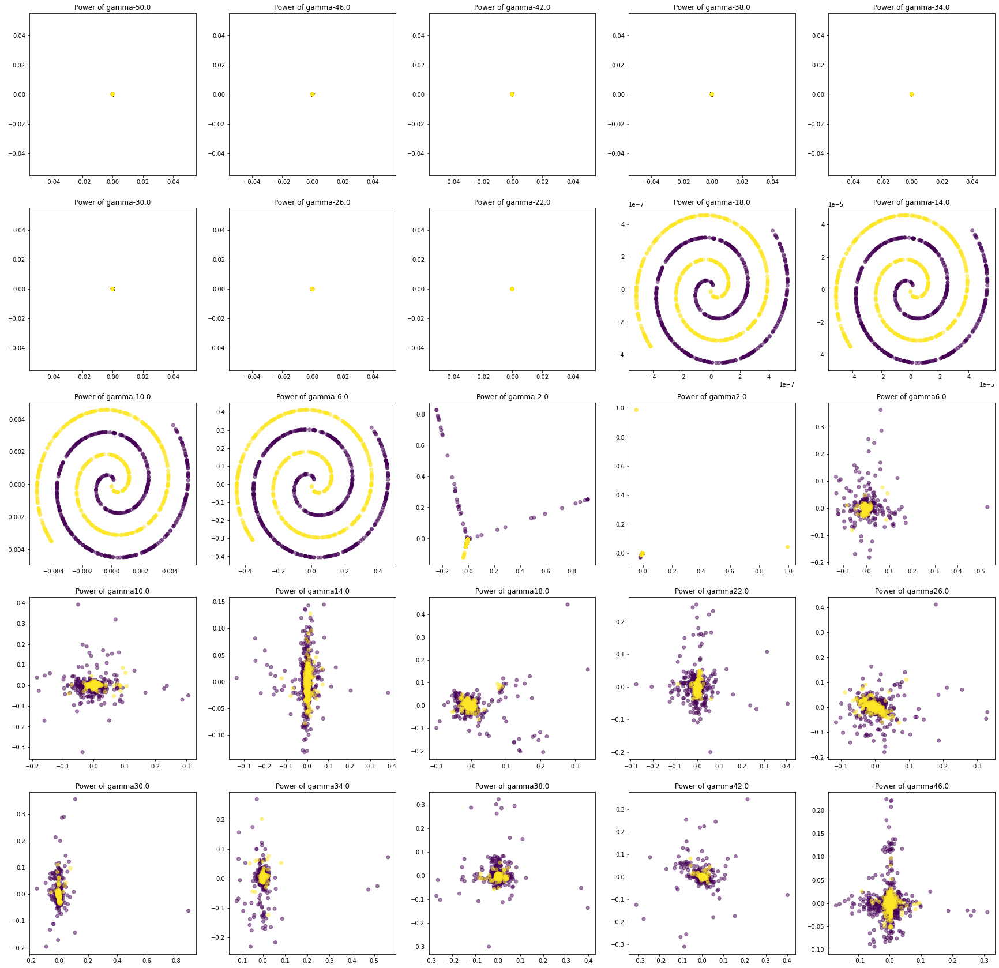

In [88]:

g_start = -50 #실제로는 50부터 안해도됨. 40부터해도됨
g_end = 50
g_power = np.arange(g_start, g_end,  (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30,30), sharex=False, sharey=False)
for n, ax in enumerate(axs.flatten()) :
  g_value = 10**g_power[n]
  scikit_kpca = KernelPCA(n_components = 2, kernel = 'rbf', gamma=g_value)
  x_kernelpca = scikit_kpca.fit_transform(x_4)
  ax.scatter(x_kernelpca[:,0], x_kernelpca[:,1], c=y_4, alpha=0.5)
  ax.set_title('Power of gamma' +str(g_power[n]), size=12)



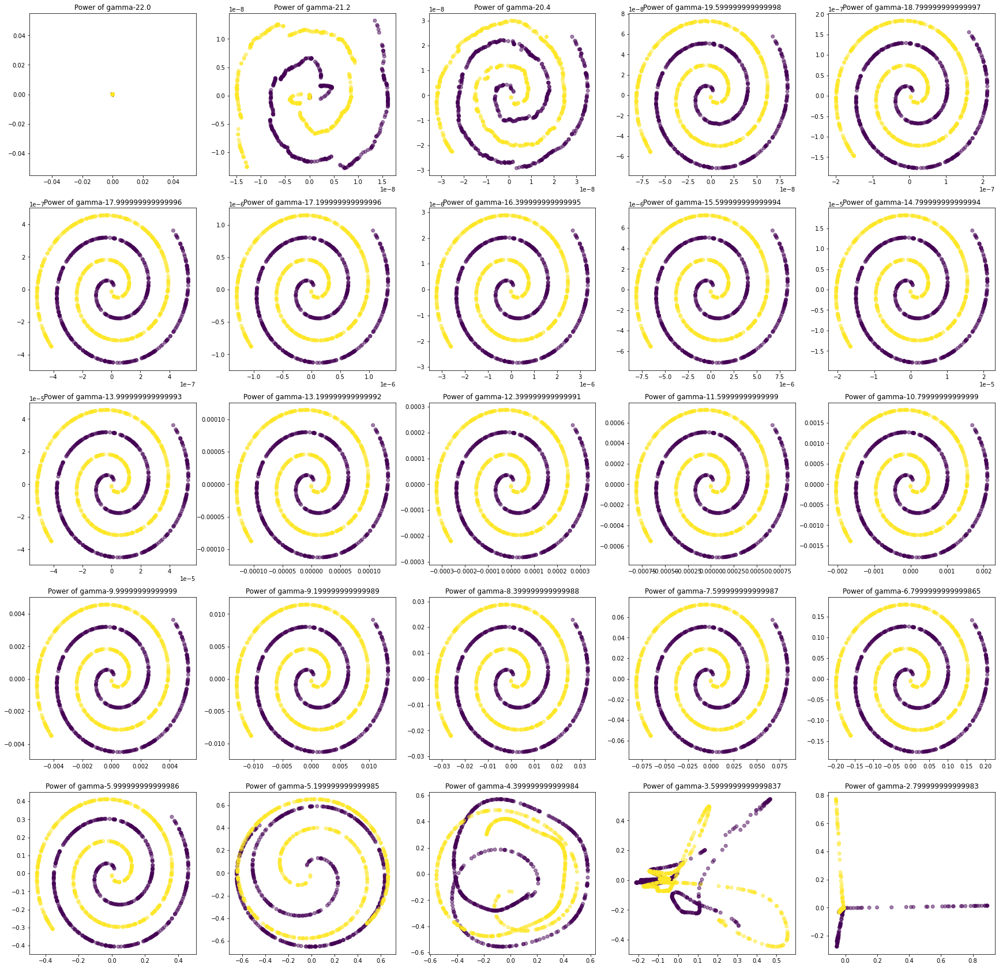

In [90]:

g_start = -22 #실제로는 50부터 안해도됨. 40부터해도됨
g_end = -2
g_power = np.arange(g_start, g_end,  (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30,30), sharex=False, sharey=False)
for n, ax in enumerate(axs.flatten()) :
  g_value = 10**g_power[n]
  scikit_kpca = KernelPCA(n_components = 2, kernel = 'rbf', gamma=g_value)
  x_kernelpca = scikit_kpca.fit_transform(x_4)
  ax.scatter(x_kernelpca[:,0], x_kernelpca[:,1], c=y_4, alpha=0.5)
  ax.set_title('Power of gamma' +str(g_power[n]), size=12)



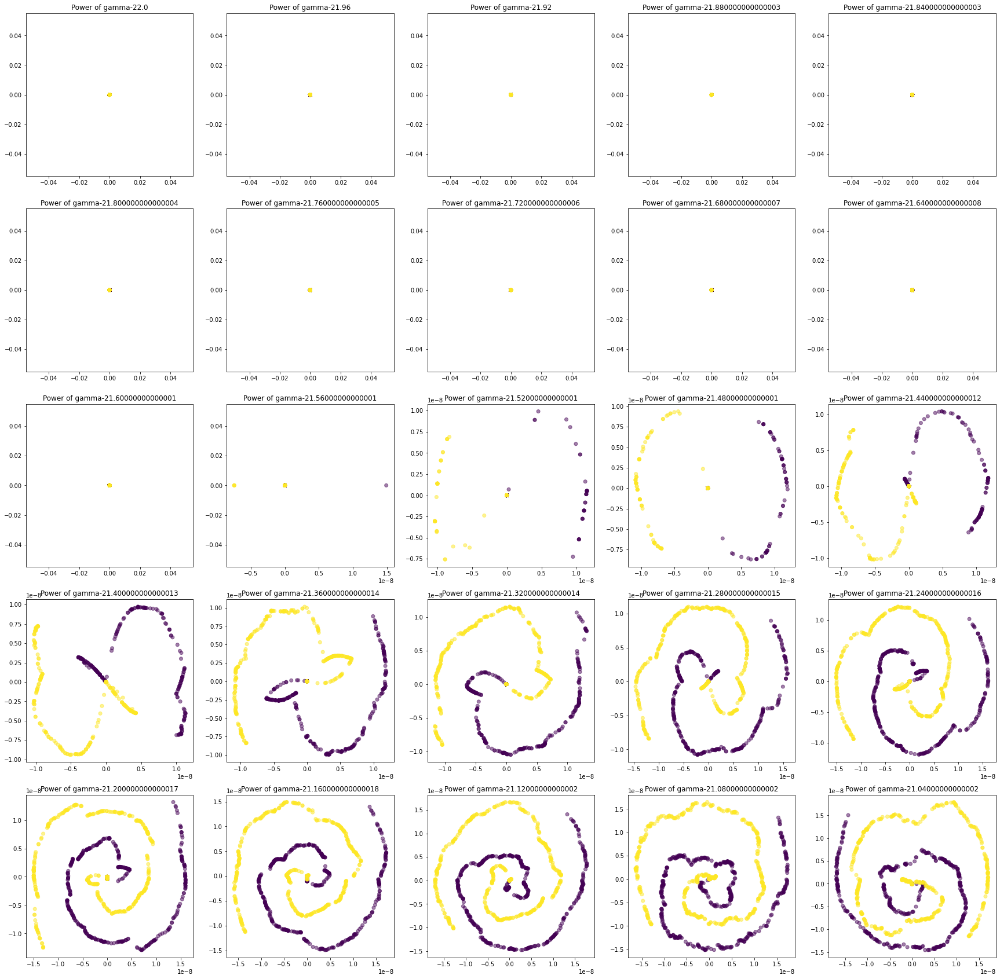

In [91]:

g_start = -22 
g_end = -21
g_power = np.arange(g_start, g_end,  (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(30,30), sharex=False, sharey=False)
for n, ax in enumerate(axs.flatten()) :
  g_value = 10**g_power[n]
  scikit_kpca = KernelPCA(n_components = 2, kernel = 'rbf', gamma=g_value)
  x_kernelpca = scikit_kpca.fit_transform(x_4)
  ax.scatter(x_kernelpca[:,0], x_kernelpca[:,1], c=y_4, alpha=0.5)
  ax.set_title('Power of gamma' +str(g_power[n]), size=12)

# -21.48 쯤에서 구분이 되는 것 처럼보임

### Polynomial Kernel

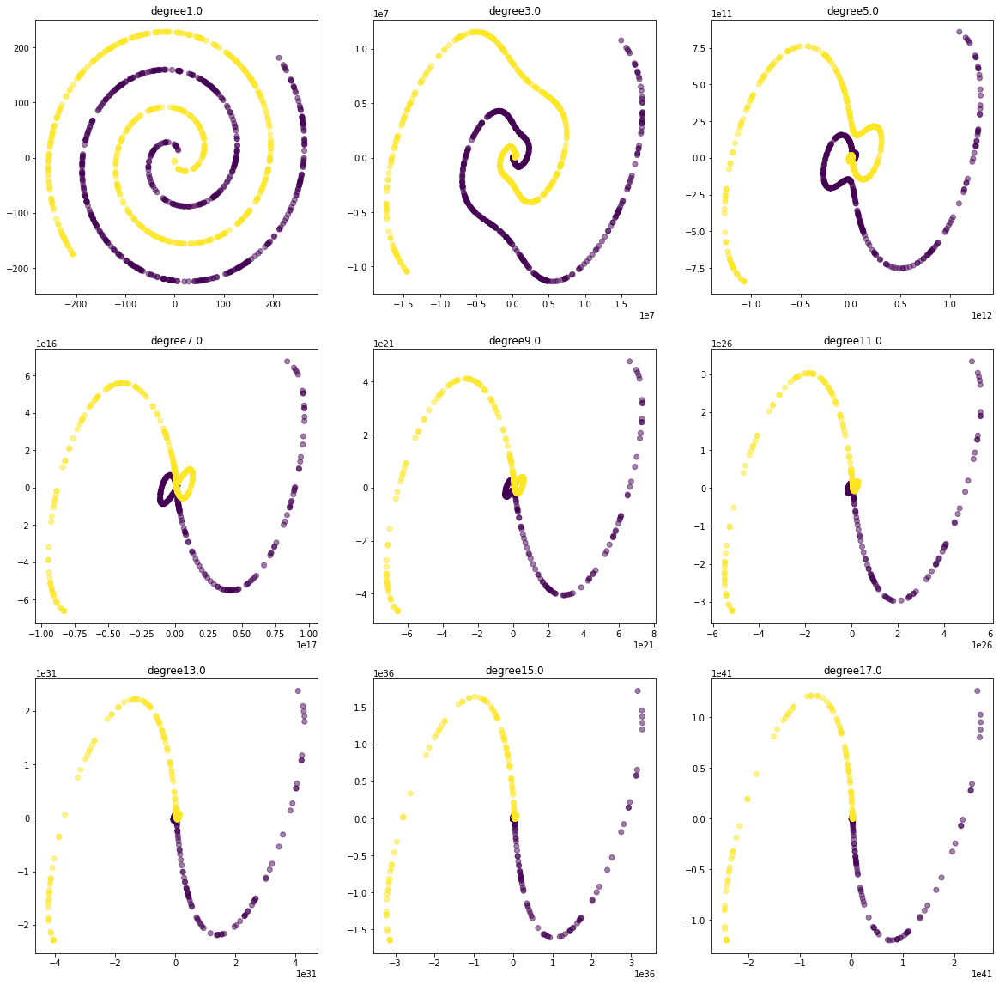

In [92]:
# 비선형 관계를 선형으로 바꿔주는 적절한 degree를 찾아야 함.
g_start=1
g_end=19
g_power = np.arange(g_start,g_end, (g_end-g_start)/9)

fig, axs = plt.subplots(nrows=3,ncols=3,figsize=(20,20),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='poly',degree=g_power[n])
  X_skernpca = scikit_kpca.fit_transform(x_4)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_4,alpha=0.5)
  ax.set_title('degree'+str(g_power[n]),size=12)

### Sigmoid Kernel

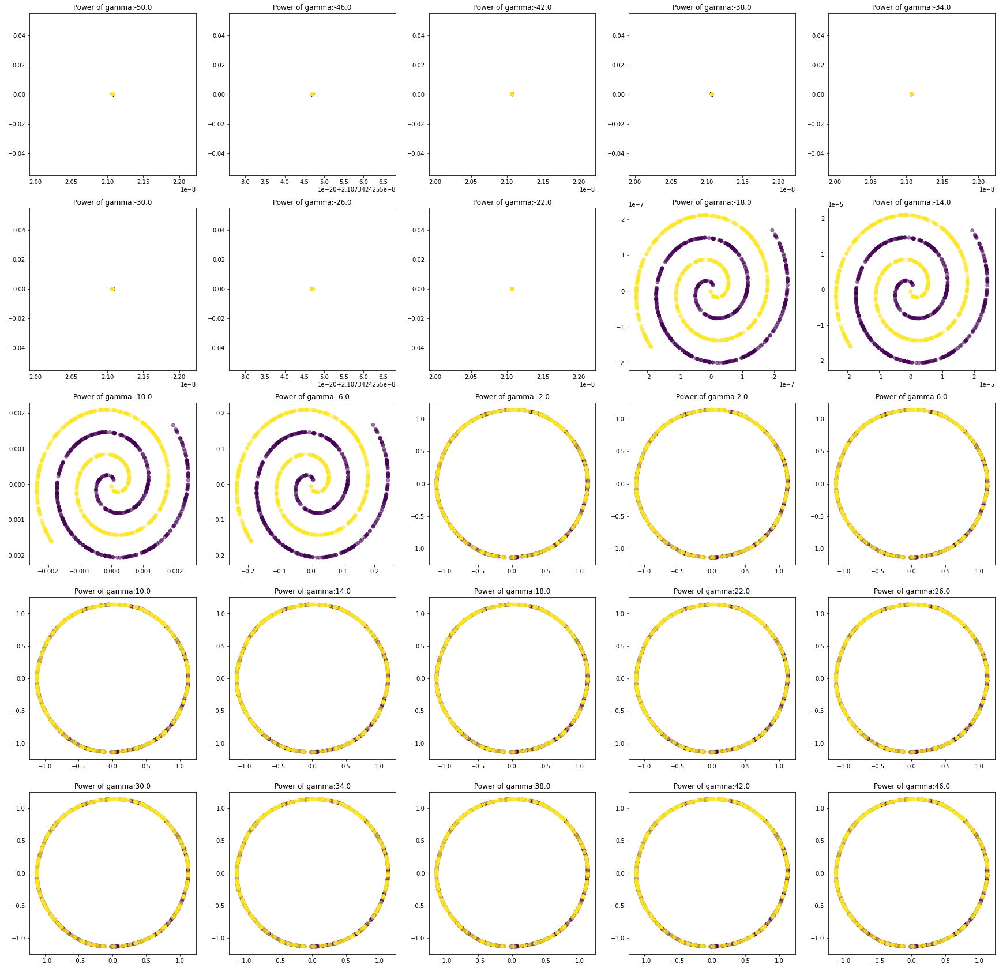

In [93]:
g_start=-50
g_end=50
g_power=np.arange(g_start,g_end,(g_end-g_start)/25)

fig,axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n , ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='sigmoid',gamma=g_value)
  X_skernpca=scikit_kpca.fit_transform(x_4)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_4,alpha=0.5)
  ax.set_title("Power of gamma:" + str(g_power[n]))

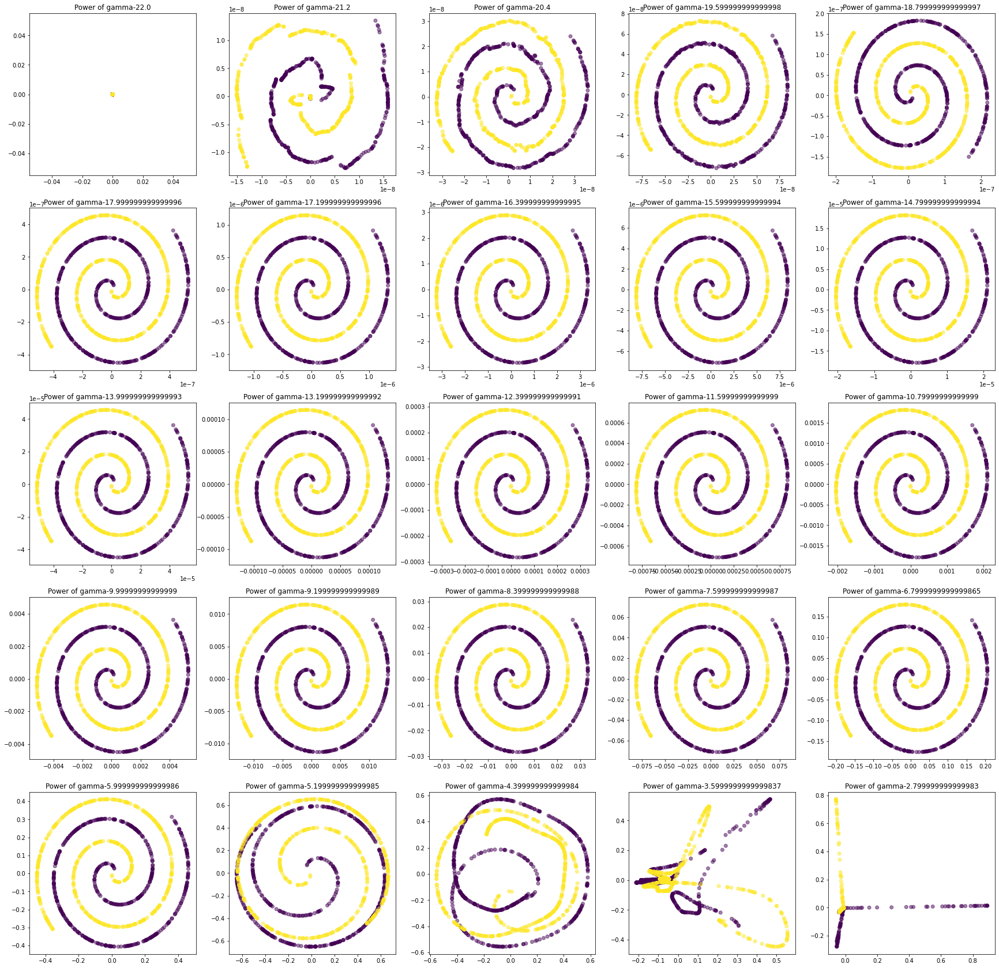

In [94]:

g_start=-22
g_end=-2
g_power = np.arange(g_start,g_end, (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
  X_skernpca = scikit_kpca.fit_transform(x_4)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_4,alpha=0.5)
  ax.set_title('Power of gamma'+str(g_power[n]),size=12)

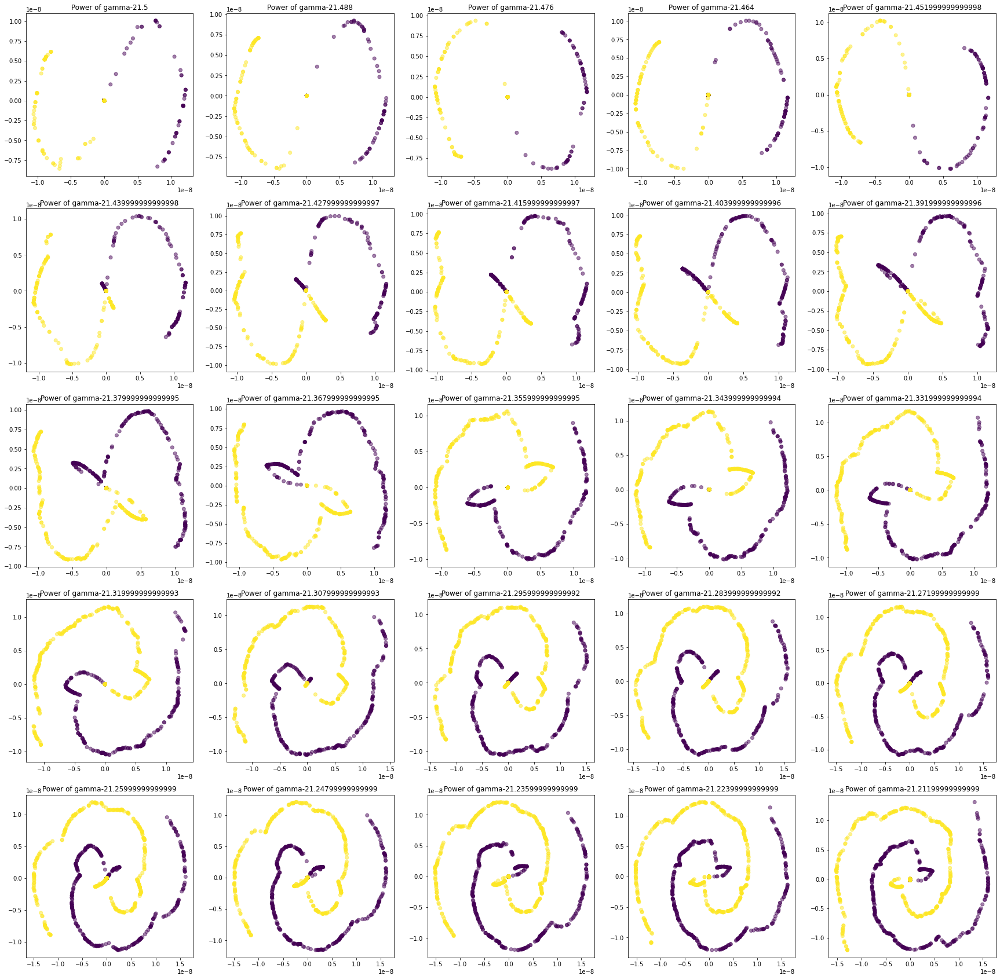

In [96]:

g_start=-21.5
g_end=-21.2
g_power = np.arange(g_start,g_end, (g_end-g_start)/25)

fig, axs = plt.subplots(nrows=5,ncols=5,figsize=(30,30),sharex=False,sharey=False)

for n, ax in enumerate(axs.flatten()):
  g_value=10**g_power[n]
  scikit_kpca=KernelPCA(n_components=2,kernel='rbf',gamma=g_value)
  X_skernpca = scikit_kpca.fit_transform(x_4)
  ax.scatter(X_skernpca[:,0],X_skernpca[:,1],c=y_4,alpha=0.5)
  ax.set_title('Power of gamma'+str(g_power[n]),size=12)